# Visão Computacional - Lista de Exercícios 2
Alunos:
- Luana Júlia Nunes Ferreira
- Lucas Mendes Massa

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Questão 1

In [2]:
car1 = cv2.imread('./car1.jpg')
car2 = cv2.imread('./car2.jpg')
cube1 = cv2.imread('./cube1.jpg')
cube2 = cv2.imread('./cube2.jpg')
plane1 = cv2.imread('./plane1.jpg')
plane2 = cv2.imread('./plane2.jpg')

In [3]:
car1 = cv2.cvtColor(car1,cv2.COLOR_BGR2RGB)
car2 = cv2.cvtColor(car2,cv2.COLOR_BGR2RGB)
cube1 = cv2.cvtColor(cube1,cv2.COLOR_BGR2RGB)
cube2 = cv2.cvtColor(cube2,cv2.COLOR_BGR2RGB)
plane1 = cv2.cvtColor(plane1,cv2.COLOR_BGR2RGB)
plane2 = cv2.cvtColor(plane2,cv2.COLOR_BGR2RGB)

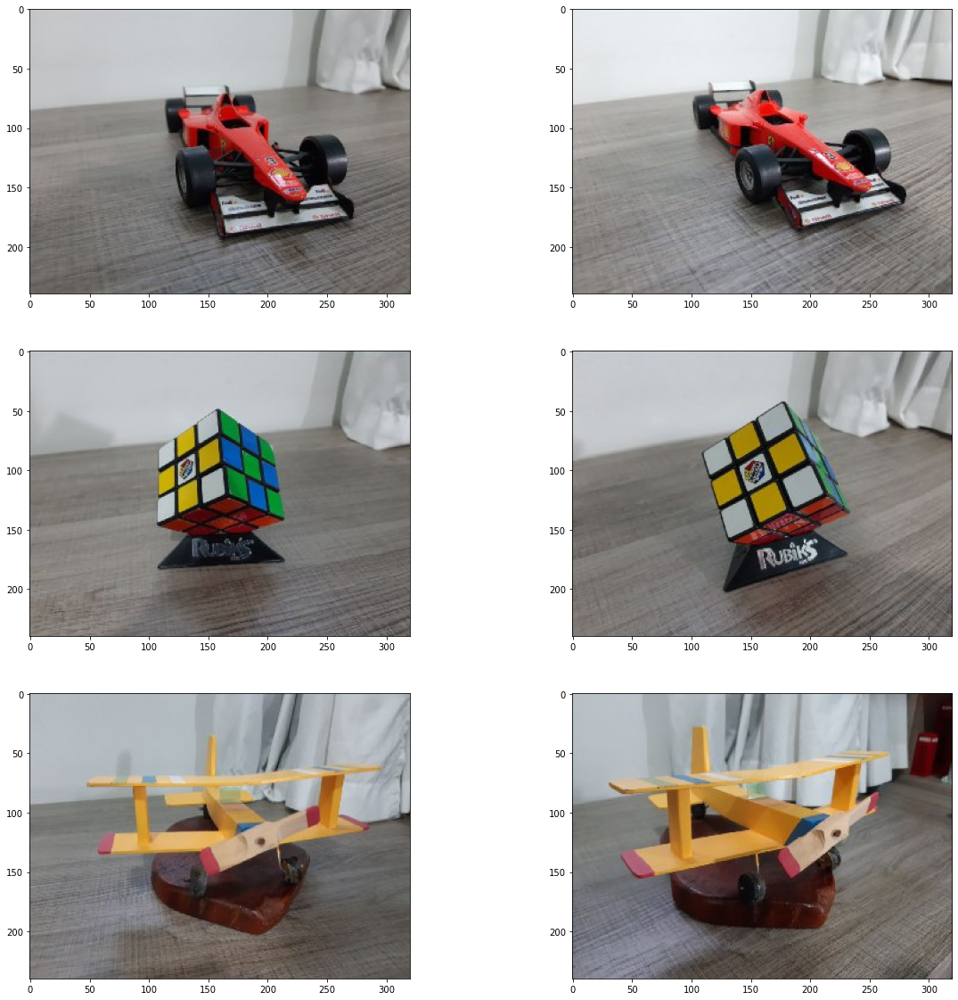

In [4]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1)
axarr[0,1].imshow(car2)
axarr[1,0].imshow(cube1)
axarr[1,1].imshow(cube2)
axarr[2,0].imshow(plane1)
axarr[2,1].imshow(plane2)

 ### Detector de Harris
 
Encontra a diferença de intensidade para um deslocamento específico em todas as direções com o objetivo de detectar quinas. Para isso, é preciso maximizar a função que detecta bordas utilizando a função janela em forma retangular ou gaussiana.Daí, é aplicada a expansão de Taylor, obtendo-se uma matriz M. Com isso, calcula-se o valor do parâmetro R, dado pela expressão: R = det(M) - k*(traço(M))². Sendo assim, caso |R| seja pequeno, isso significa que a região é plana; caso R < 0, a região é uma borda. Por fim, caso R seja muito grande, a região é classificada como quina. Esse detector é muito utilizado por sua invariância a rotação, escala, condições de iluminação e ruído de escala. A entrada é uma imagem em escala de cinza, o tamanho da janela de detecção, o parâmetro de abertura da derivada de Sobel e o parâmetro  de sensibilidade ajustável k, presente na expressão usada para calcular R. A fim de filtrar os possíveis erros de detecção, é aplicado um limiar adicional à medida das quinas.


In [5]:
def runHarrisDetector(img,bs,ks,k,t):
    img = img.copy()
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    h = cv2.cornerHarris(gray,bs,ks,k)
    img[h>t*h.max()]=[255,0,0]
    return img

In [6]:
car1_harris = runHarrisDetector(car1,2,3,0.04,0.01)
car2_harris = runHarrisDetector(car2,2,3,0.04,0.01)
cube1_harris = runHarrisDetector(cube1,2,3,0.04,0.01)
cube2_harris = runHarrisDetector(cube2,2,3,0.04,0.01)
plane1_harris = runHarrisDetector(plane1,2,3,0.04,0.01)
plane2_harris = runHarrisDetector(plane2,2,3,0.04,0.01)

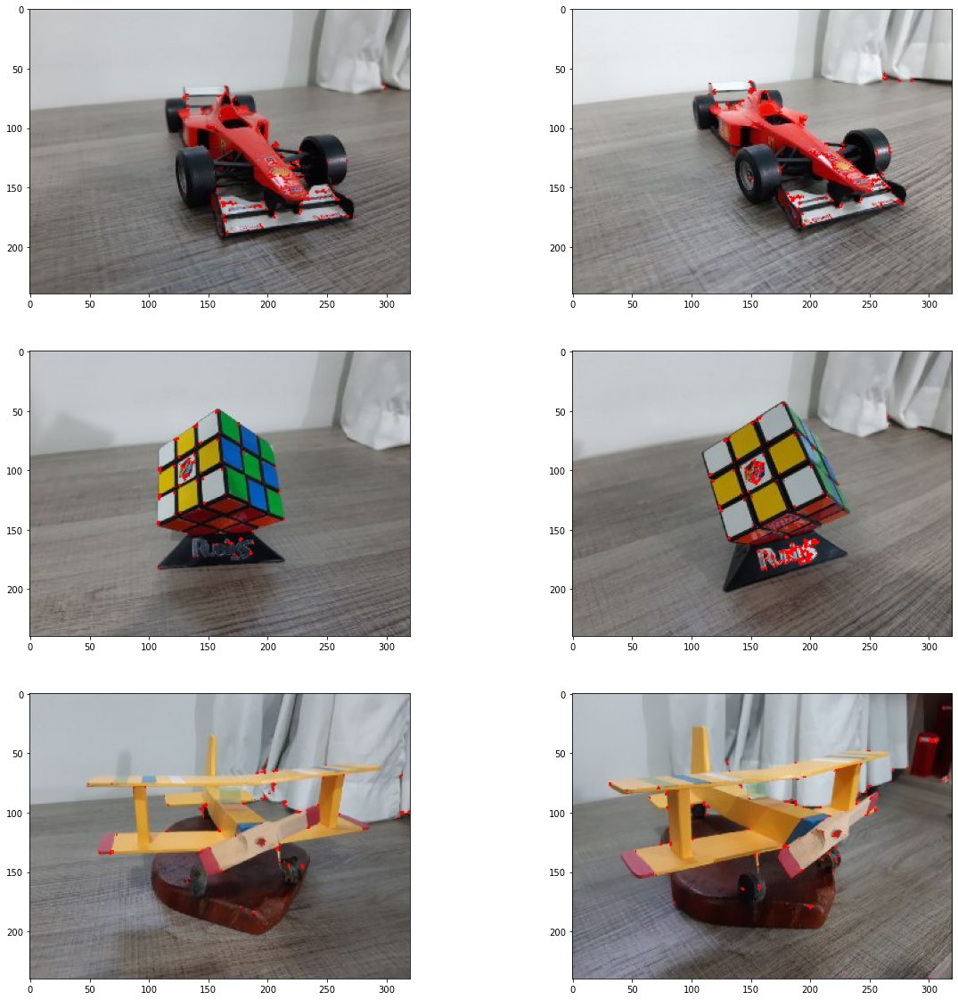

In [7]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_harris)
axarr[0,1].imshow(car2_harris)
axarr[1,0].imshow(cube1_harris)
axarr[1,1].imshow(cube2_harris)
axarr[2,0].imshow(plane1_harris)
axarr[2,1].imshow(plane2_harris)

### Detector Shi-Tomasi

Esse detector é baseado no modelo proposto pelo método Harris. A diferença está na medida de canto, a qual passa a ser determinada como o menor dos valores absolutos dos autovalores (λ1 e λ2) da matriz M citada anteriormente. Dessa forma, o critério de medição de canto é definido como R = mínimo(|λ1| , |λ2|). No método Shi-Tomasi, os cantos são os máximos locais de R. Essa medida de canto é considerada mais robusta quando comparada com o método proposto no algoritmo Harris. A entrada da função é uma imagem em escala de cinza, o número de quinas a serem detectadas, um parâmetro de qualidade (o qual é multiplicado pela medida de qualidade da melhor quina, gerando um valor limite para as quinas), a distância euclidiana mínima possível entre duas quinas detectadas, o tamanho do bloco da matriz de covariância, uma variável booleana para indicar se o detector de Harris deve ser utilizado e o parâmetro  de sensibilidade ajustável k.

In [8]:
def runShiTomasi(img,mc,q,md):
    img = img.copy()
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    st = cv2.goodFeaturesToTrack(gray,mc,q,md)
    st = np.int0(st)
    for i in st:
        x,y = i.ravel()
        cv2.circle(img,(x,y),2,255,-1)
    return img

In [9]:
car1_shi = runShiTomasi(car1,50,0.01,5)
car2_shi = runShiTomasi(car2,50,0.01,5)
cube1_shi = runShiTomasi(cube1,50,0.01,5)
cube2_shi = runShiTomasi(cube2,50,0.01,5)
plane1_shi = runShiTomasi(plane1,50,0.01,5)
plane2_shi = runShiTomasi(plane2,50,0.01,5)

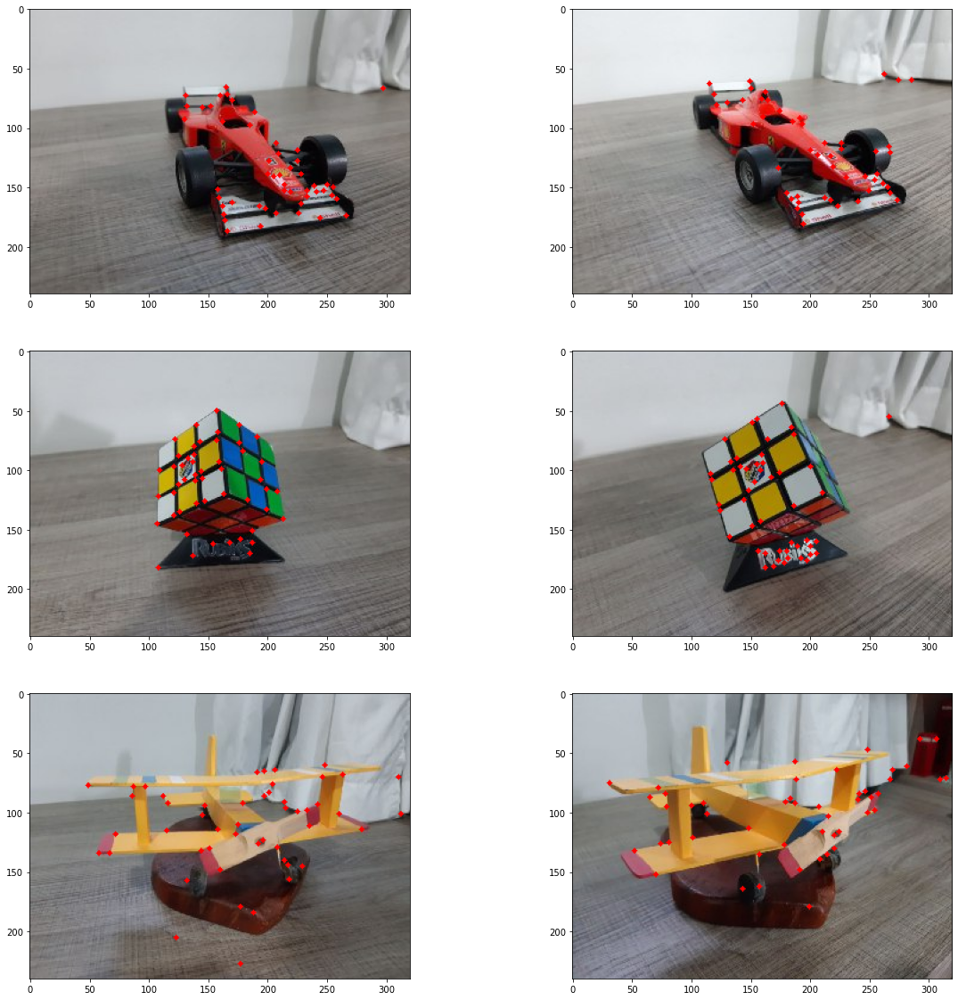

In [10]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_shi)
axarr[0,1].imshow(car2_shi)
axarr[1,0].imshow(cube1_shi)
axarr[1,1].imshow(cube2_shi)
axarr[2,0].imshow(plane1_shi)
axarr[2,1].imshow(plane2_shi)

### Detector FAST

Nesse algoritmo procura-se identificar pontos de interesse em uma imagem. Primeiramente, seleciona-se um pixel p da imagem com intensidade i. Daí, define-se um valor de intensidade limite T e considera-se um círculo de 16 pixels ao redor do pixel p. Os n pixels contíguos do pixel p precisam estar acima ou abaixo do i + T e n ≧ 12. Então, compara-se a intensidade de 4 pixels com p para satisfazer o critério de limiar, caso contrário, esse não é um ponto de interesse. A partir daí, segue-se analisando todos os 16 pixels e verificando os 12 pixels contíguos, repetindo o procedimento para todos os pixels da imagem. Ademais, é aplicada a supressão não-máxima e a entrada da função é a própria imagem. O FAST é amplamente utilizado por sua necessidade de processamento reduzida. No entanto, seus recursos não possuem uma componente de orientação, sendo variante quanto à rotação.


In [11]:
def runFastDetector(img):
    img = img.copy()
    fast = cv2.FastFeatureDetector_create()
    kp = fast.detect(img,None)
    img = cv2.drawKeypoints(img, kp, None, color=(255,0,0))
    return img

In [12]:
car1_fast = runFastDetector(car1)
car2_fast = runFastDetector(car2)
cube1_fast = runFastDetector(cube1)
cube2_fast = runFastDetector(cube2)
plane1_fast = runFastDetector(plane1)
plane2_fast = runFastDetector(plane2)

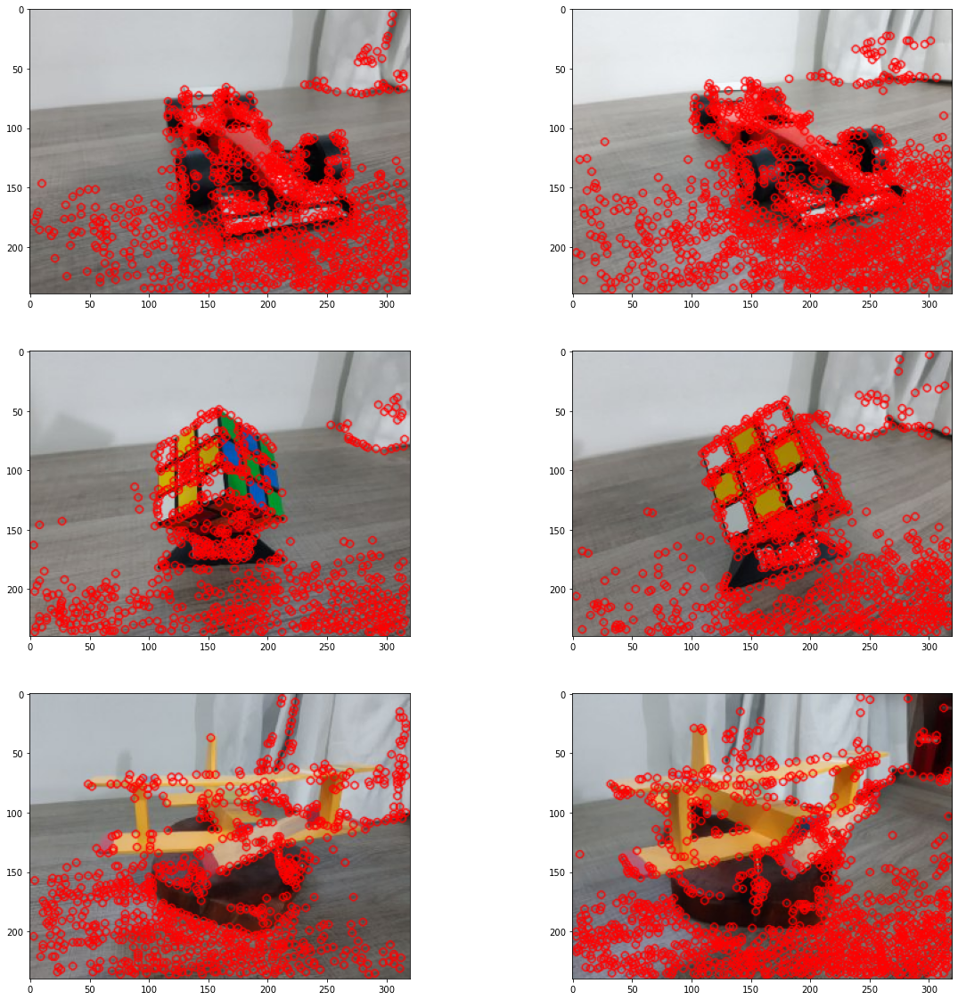

In [13]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_fast)
axarr[0,1].imshow(car2_fast)
axarr[1,0].imshow(cube1_fast)
axarr[1,1].imshow(cube2_fast)
axarr[2,0].imshow(plane1_fast)
axarr[2,1].imshow(plane2_fast)

# Questão 2

### SIFT

Esse descritor extrai um conjunto de descritores de uma imagem, os quais são invariantes quanto à translação, a rotação e ao dimensionamento de imagens. Tais descritores obtidos são considerados robustos para pequenas mudanças na imagem, tais quais: ponto de vista, ruído, desfoque, mudanças de contraste e deformação de cena. Assim, o processo de descrição dos pontos de interesse com o SIFT dependem, primeiramente, da atribuição de orientação, o qual é feito com base em uma ou mais orientações. Essa orientação fornece um histograma de gradiente em uma janela 16x16 em torno do ponto de interesse (alinhados em uma grade 4x4). A partir daí, cada histograma tem 8 variações de orientação, o que nos dá um vetor descritor com 128 elementos para cada ponto de interesse. Para utilizar o algoritmo, é criado um objeto SIFT que recebe parâmetros opcionais, sendo os principais deles: o número de características para reter, o número de camadas em cada oitava, o limiar do contraste utilizado no filtro de “características fracas”, o limiar de borda e o valor de sigma da gaussiana aplicada à imagem de entrada.


In [14]:
def runSIFT(img):
    img = img.copy()
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    kp = sift.detect(gray,None)
    img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [15]:
car1_sift = runSIFT(car1)
car2_sift = runSIFT(car2)
cube1_sift = runSIFT(cube1)
cube2_sift = runSIFT(cube2)
plane1_sift = runSIFT(plane1)
plane2_sift = runSIFT(plane2)

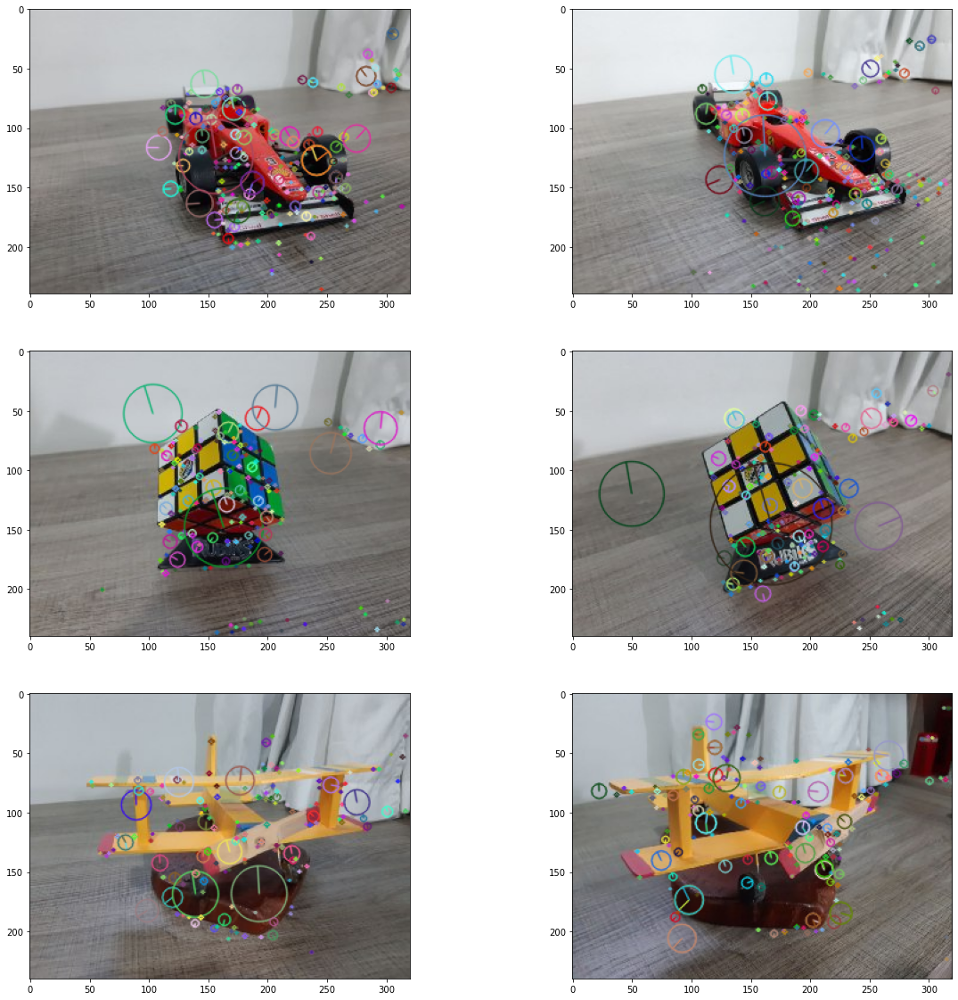

In [16]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_sift)
axarr[0,1].imshow(car2_sift)
axarr[1,0].imshow(cube1_sift)
axarr[1,1].imshow(cube2_sift)
axarr[2,0].imshow(plane1_sift)
axarr[2,1].imshow(plane2_sift)

### BRIEF

Esse é um descritor que utiliza testes binários simples entre pixels em um trecho de imagem suavizada. É invariante à iluminação, desfoque e distorções de perspectiva, mas é muito sensível a rotações no plano. Sendo assim, o BRIEF produz uma descrição de cadeia de bit, a qual é uma série de valores 0 ou 1. Então, é aplicado um teste binário, cujo resultado é um único bit, e esse teste é reproduzido várias vezes até gerar uma cadeia de bits de comprimento n em um trecho p. Por fim, a sequência de bits resultante representa o descritor BRIEF para o trecho p.
Os parâmetros da função são: o comprimento do descritor em bytes (16, 32 ou 64) e uma variável booleana que determina se o algoritmo utilizará exemplos de padrões com orientação de pontos de interesse.


In [17]:
def runBRIEF(img):
    img = img.copy()
    star = cv2.xfeatures2d.StarDetector_create()
    brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    kp = star.detect(img,None)
    kp, des = brief.compute(img, kp)
    img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [18]:
car1_brief = runBRIEF(car1)
car2_brief = runBRIEF(car2)
cube1_brief = runBRIEF(cube1)
cube2_brief = runBRIEF(cube2)
plane1_brief = runBRIEF(plane1)
plane2_brief = runBRIEF(plane2)

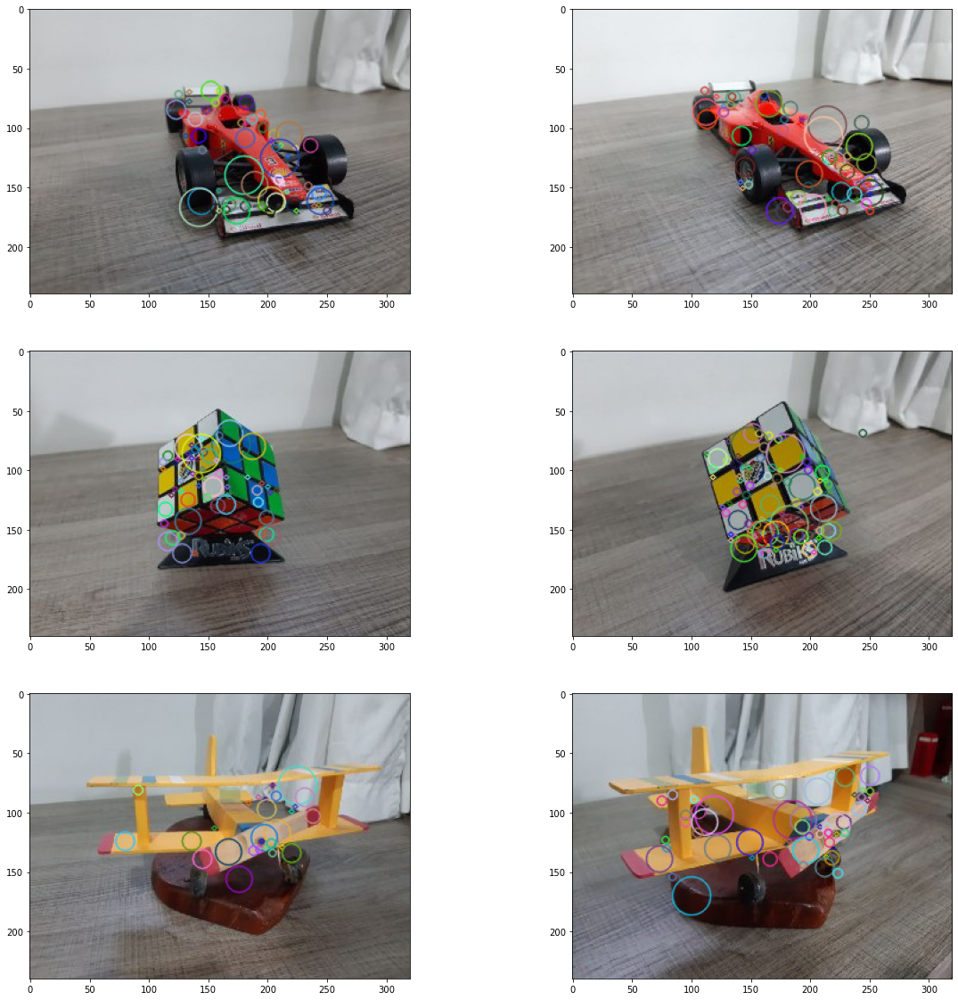

In [19]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_brief)
axarr[0,1].imshow(car2_brief)
axarr[1,0].imshow(cube1_brief)
axarr[1,1].imshow(cube2_brief)
axarr[2,0].imshow(plane1_brief)
axarr[2,1].imshow(plane2_brief)

### ORB

Esse descritor surgiu com o intuito de melhorar o desempenho computacional e seus resultados relacionados às variações de rotação das imagens. Nesse contexto, o algoritmo é obtido a partir de uma fusão do detector FAST com o descritor BRIEF. Ao utilizar o ORB, os pontos de interesse são detectados com base no FATS. Daí, é aplicado o detector de Harris para encontrar os N pontos principais. Por fim, o ORB calcula o centróide ponderado da intensidade  do trecho com o ponto de interesse localizado no centro. Além disso, para melhorar a variância de rotação, os momentos são calculados em X e Y dentro de uma região circular de raio r. Para utilizar o algoritmo, cria-se um objeto ORB com a respectiva função openCV, cujos principais parâmetros são: o número máximo de características retidas, o tipo de score utilizado (Harris ou FAST), o número de pontos que produzem cada elemento do descritor BRIEF orientado.

In [20]:
def runORB(img):
    img = img.copy()
    orb = cv2.ORB_create()
    kp = orb.detect(img,None)
    kp, des = orb.compute(img, kp)
    img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [21]:
car1_orb = runORB(car1)
car2_orb = runORB(car2)
cube1_orb = runORB(cube1)
cube2_orb = runORB(cube2)
plane1_orb = runORB(plane1)
plane2_orb = runORB(plane2)

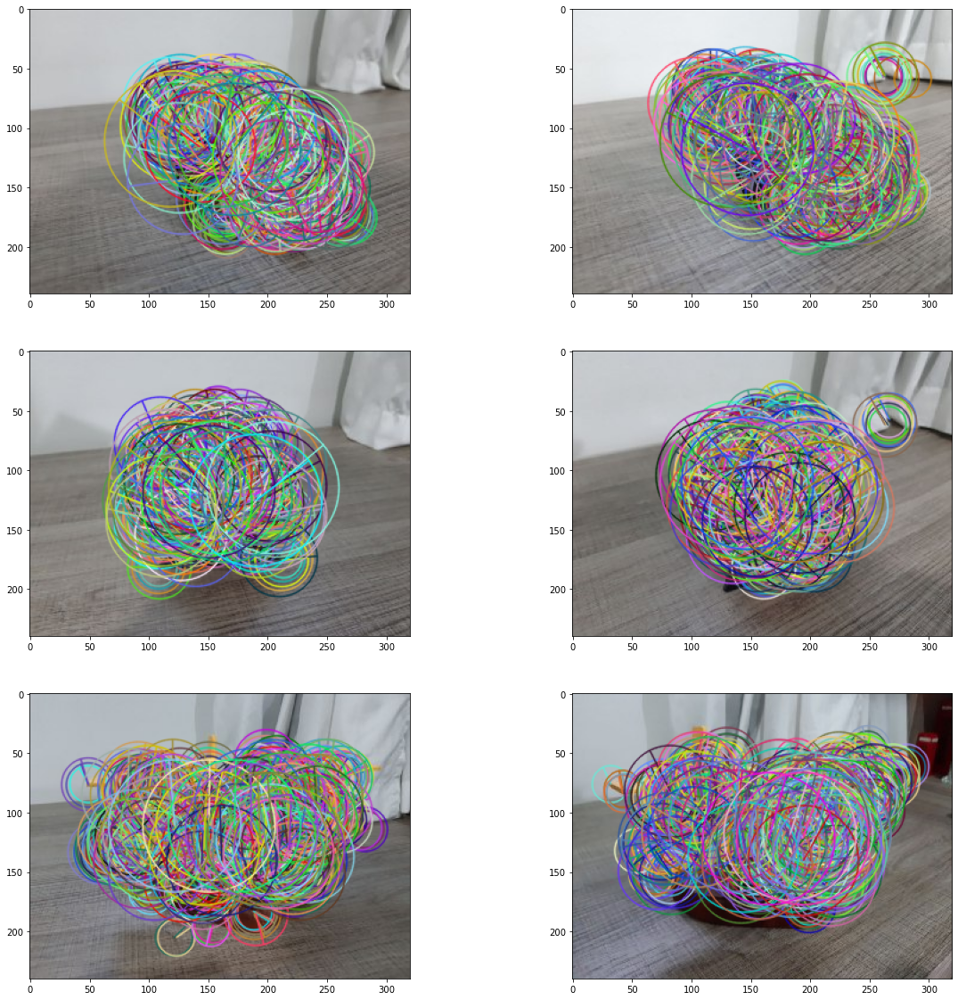

In [22]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_orb)
axarr[0,1].imshow(car2_orb)
axarr[1,0].imshow(cube1_orb)
axarr[1,1].imshow(cube2_orb)
axarr[2,0].imshow(plane1_orb)
axarr[2,1].imshow(plane2_orb)

# Questão 3

### Brute Force com ORB

O algoritmo Brute-Force pega uma feature em um primeiro conjunto e faz uma busca para combinar com as features de um segundo conjunto de features a partir de algum parâmetro de distância entre elas, retornando a mais próxima. Para isso, é criado o objeto BFMatcher, o qual possui dois parâmetros opcionais: o tipo de medida de distância utilizada e uma variável booleana crossCheck que determina se a feature é uma correspondência do conjunto A no conjunto B e vice-versa. No caso da combinação do Brute-Force com o ORB, a medida de distância utilizada deve ser a Distância de Hamming e a booleana crossCheck deve ser verdadeira.


In [23]:
def matcher1(img1,img2):
    img1 = img1.copy()
    img2 = img2.copy()
    img1 = cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    orb = cv2.ORB_create()
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1,des2)
    matches = sorted(matches, key = lambda x:x.distance)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:25],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    return img3

In [24]:
car_m1 = matcher1(car1,car2)
cube_m1 = matcher1(cube1,cube2)
plane_m1 = matcher1(plane1,plane2)

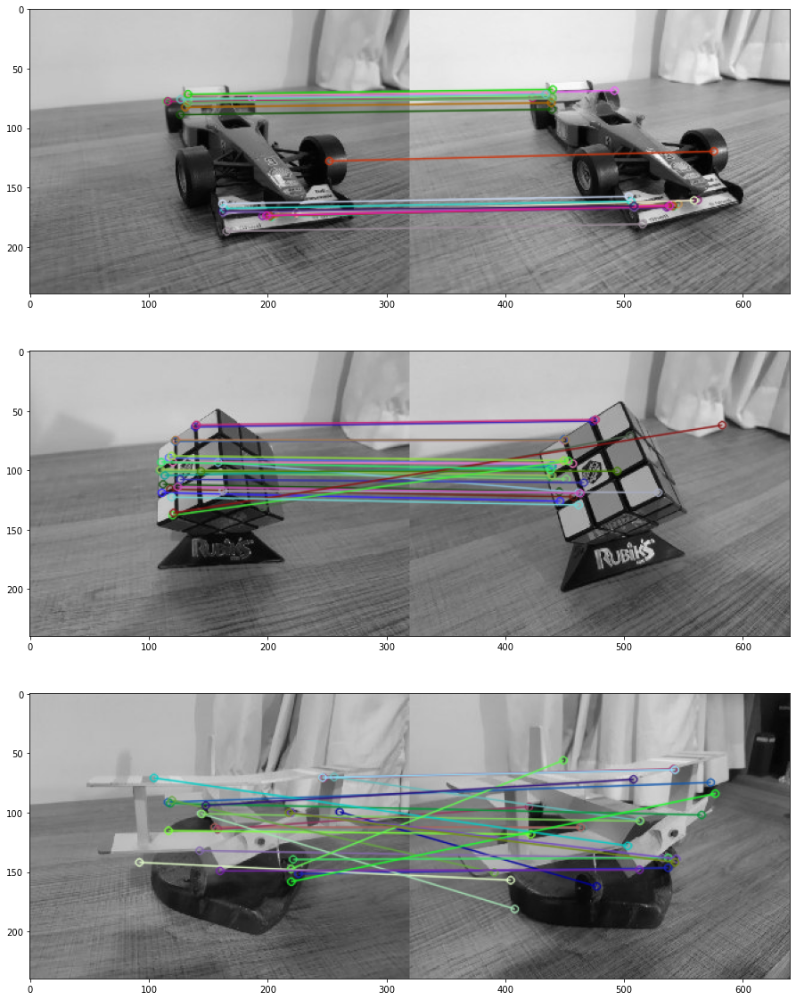

In [25]:
f, axarr = plt.subplots(3,1, figsize=(20,20))
axarr[0].imshow(car_m1)
axarr[1].imshow(cube_m1)
axarr[2].imshow(plane_m1)

### Matcher com SIFT e ratio test

Nesse caso, utiliza-se o algoritmo Brute-Force do item anterior em combinação com com a função KNN Match (K-nearest neighbor, ou os k vizinhos mais próximos) para obter as k melhores correspondências após computar os pontos de interesse e os descritores encontrados pelo algoritmo SIFT. Por fim, aplica-se o ratio test para filtrar as melhores correspondências entre as features.


In [26]:
def matcher2(img1,img2):
    img1 = img1.copy()
    img2 = img2.copy()
    img1 = cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2,k=2)
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])
    img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    return img3

In [27]:
car_m2 = matcher2(car1,car2)
cube_m2 = matcher2(cube1,cube2)
plane_m2 = matcher2(plane1,plane2)

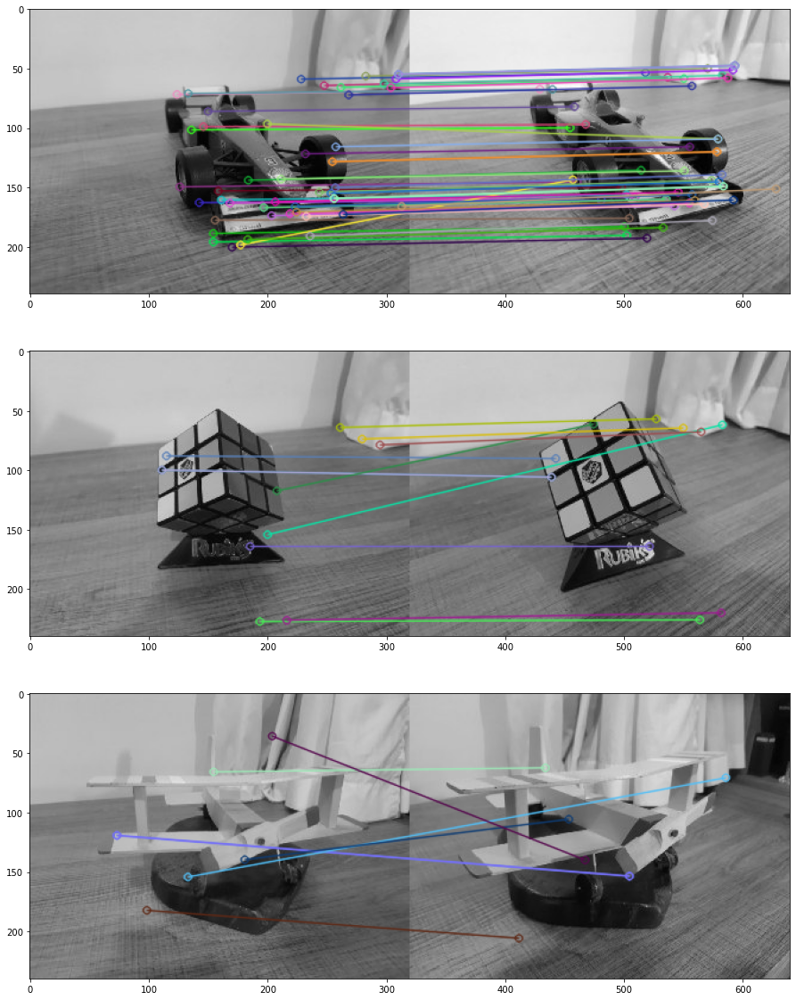

In [28]:
f, axarr = plt.subplots(3,1, figsize=(20,20))
axarr[0].imshow(car_m2)
axarr[1].imshow(cube_m2)
axarr[2].imshow(plane_m2)

### Matcher FLANN

Esse método visa otimizar os algoritmos de busca pelos vizinhos mais próximos deixando-os mais rápidos, principalmente em grandes bases de dados. Na utilização do FLANN, os parâmetros são dois dicionários, um contendo informações tais quais: algoritmo utilizado e outros parâmetros relacionados e o outro com os parâmetros de busca. Além disso, é necessário passar uma máscara nas correspondências, a fim de filtrar apenas as mais precisas. 

In [29]:
def matcher3(img1,img2):
    img1 = img1.copy()
    img2 = img2.copy()
    img1 = cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   
    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    matchesMask = [[0,0] for i in range(len(matches))]
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.8*n.distance:
            matchesMask[i]=[1,0]
    draw_params = dict(matchColor = (0,255,0),
                       singlePointColor = (255,0,0),
                       matchesMask = matchesMask,
                       flags = cv2.DrawMatchesFlags_DEFAULT)
    img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
    return img3

In [30]:
car_m3 = matcher3(car1,car2)
cube_m3 = matcher3(cube1,cube2)
plane_m3 = matcher3(plane1,plane2)

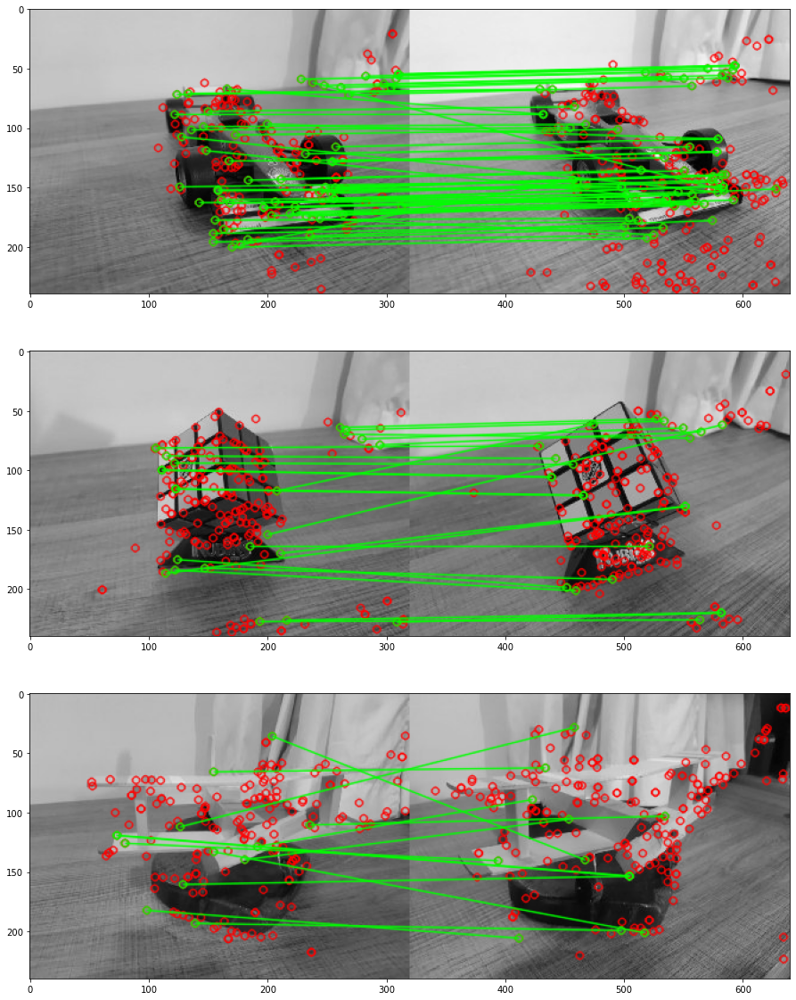

In [31]:
f, axarr = plt.subplots(3,1, figsize=(20,20))
axarr[0].imshow(car_m3)
axarr[1].imshow(cube_m3)
axarr[2].imshow(plane_m3)

# Questão 4
Uma metodologia a se utilizar para o propósito de geração de correspondências entre imagens é a apresentada por David G. Lowe em seu artigo Distinctive Image Features from Scale-Invariant Keypoints(https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf). Nele é mostrada uma técnica para obtenção de descritores invariantes para os pontos de interesse da imagem, algoritmo conhecido como SIFT. Os descritores são obtidos através de histogramas das orientações das arestas em janelas criadas em torno de cada ponto de interesse detectado. Para fazer a correspondência basta encontrar em uma segunda imagem os descritores mais próximos dos da imagem atual, o que é feito a partir de distância euclideana. Afim de validar os resultados, faz-se um teste onde a distância obtida é comparada com a distância em relação ao segundo ponto mais próximo. Verifica-se se primeira distância é menor que a segunda multiplicada por um threshold. Quanto menor o threshold maior a diferença entre os dois valores e também maior a probabilidade da correspondência ser correta.

In [32]:
image1 = car1.copy()
image2 = car2.copy()
image1 = cv2.cvtColor(image1,cv2.COLOR_RGB2GRAY)
image2 = cv2.cvtColor(image2,cv2.COLOR_RGB2GRAY)

In [33]:
# Obtendo pontos de interesse e descritores para as imagens 
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(image1,None)
kp2, des2 = sift.detectAndCompute(image2,None)

### Testando threshold mais restrito

In [34]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.5*n.distance:
        good.append([m])
match1 = cv2.drawMatchesKnn(image1,kp1,image2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

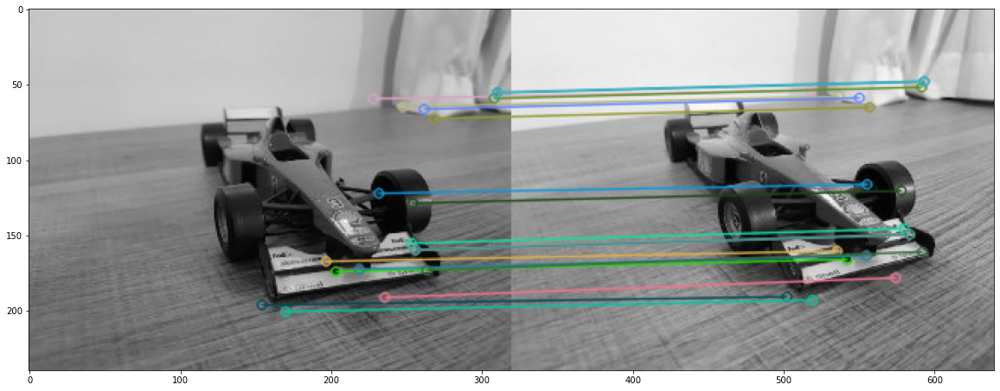

In [37]:
plt.figure(figsize=(20,20))
plt.imshow(match1)

### Testando threshold intermediário

In [38]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])
match2 = cv2.drawMatchesKnn(image1,kp1,image2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

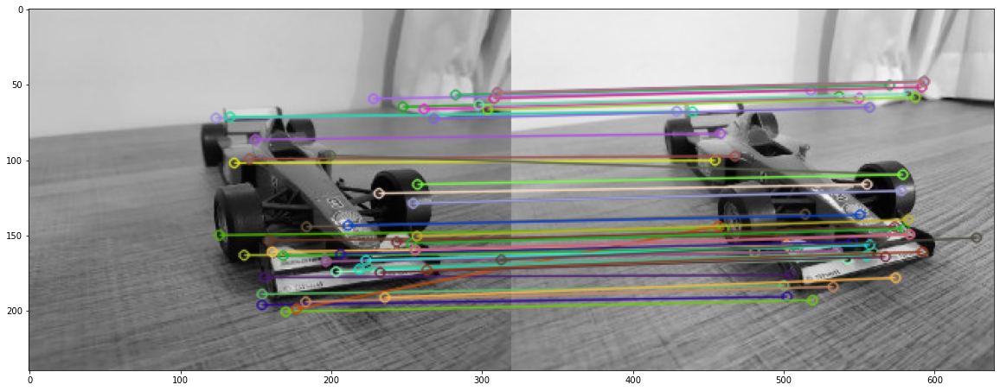

In [39]:
plt.figure(figsize=(20,20))
plt.imshow(match2)

### Testando threshold mais permissivo

In [41]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.90*n.distance:
        good.append([m])
match3 = cv2.drawMatchesKnn(image1,kp1,image2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

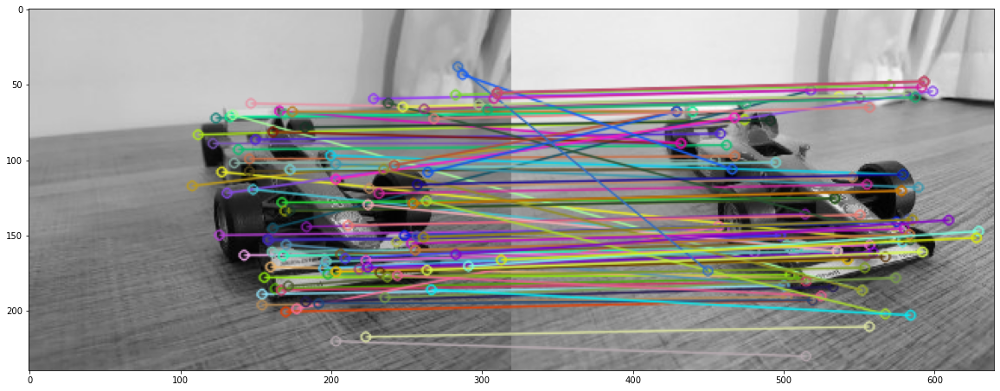

In [42]:
plt.figure(figsize=(20,20))
plt.imshow(match3)

### Discutindo resultados
É facil ver que ao tornar o threshold mais permissivo o número de correspondências encontradas torna-se maior. Entretanto também aumenta o número de resultados errôneos, chamados de outliers.

# Questão 5
Para ser considerado um ponto de interesse, uma região da imagem deve conter caraterísticas únicas da mesma. Essa unicidade permite fazer a correspondência entre pontos de interesse de imagens diferentes, já que os pontos permitem a identificação e diferenciação de elementos peculiares presentes na imagem, reduzindo a ambiguidade no momento de comparar as semelhanças. Isso faz com que os pontos de interesse geralmente se situem em quinas e vértices dos elementos presentes.

No exemplo mostrado abaixo é possível ver que a maioria dos pontos de interesse se situam em quinas localizadas nos aerofólios, bico, carenagem e cockpit do carro. Além disso, alguns se encontram nas logomarcas presentes na pintura. Dessa forma são obtidos pontos únicos e peculiares.

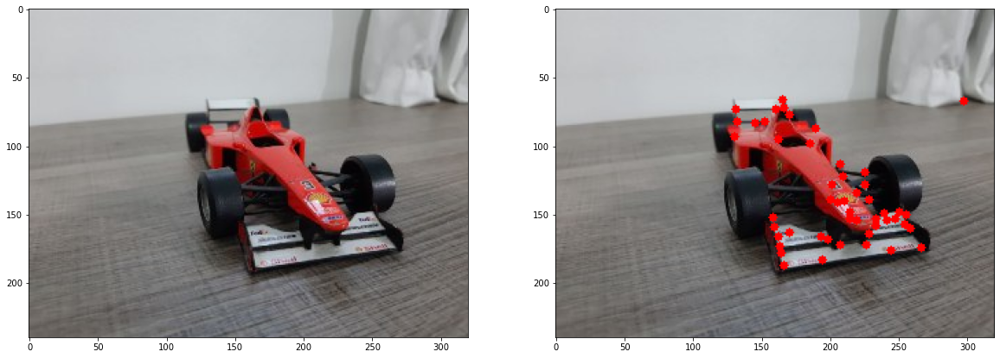

In [45]:
image = car1.copy()
gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
st = cv2.goodFeaturesToTrack(gray,50,0.01,5)
st = np.int0(st)
for i in st:
    x,y = i.ravel()
    cv2.circle(image,(x,y),3,255,-1)

f, axarr = plt.subplots(1,2, figsize=(20,20))
axarr[0].imshow(car1)
axarr[1].imshow(image)

# Questão 6

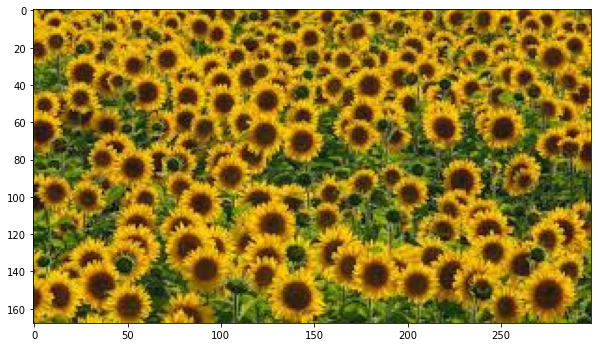

In [241]:
sf = cv2.imread('./sunflower.jpg')
sf = cv2.cvtColor(sf,cv2.COLOR_BGR2RGB)
sfg = cv2.cvtColor(sf,cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(10,10))
plt.imshow(sf,cmap='gray')

In [242]:
def LoGfilter(img,scale):
    g = cv2.GaussianBlur(img,(scale,scale),0)
    log = cv2.Laplacian(g,cv2.CV_64F)
    return log

In [243]:
scales = [3,7,11,15,19,23]

In [244]:
xys = []

for s in scales:
    result = LoGfilter(sfg,s)
    xys.append(result.tolist())
    
xys = np.array(xys)

In [245]:
xys.shape

(6, 168, 299)

In [323]:
for i in range(xys.shape[0]):
    for j in range(xys.shape[1]):
        for k in range(xys.shape[2]):
            if xys[i,j,k] > 255:
                xys[i,j,k] = 255
            if xys[i,j,k] < 0:
                xys[i,j,k] = 0

xys = xys.astype(np.float32)

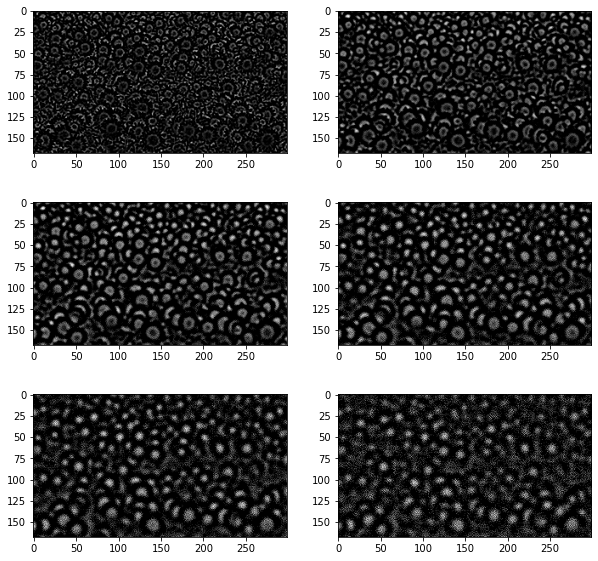

In [324]:
f, axarr = plt.subplots(3,2, figsize=(10,10))
axarr[0,0].imshow(xys[0],cmap='gray')
axarr[0,1].imshow(xys[1],cmap='gray')
axarr[1,0].imshow(xys[2],cmap='gray')
axarr[1,1].imshow(xys[3],cmap='gray')
axarr[2,0].imshow(xys[4],cmap='gray')
axarr[2,1].imshow(xys[5],cmap='gray')

In [325]:
def getBlobsPositions(images,scales):
    result = []
    dim = images[0].shape
    for i in range(1,dim[0]-1):
        for j in range(1,dim[1]-1):
            verify = True
            for k in range(len(images)):
                im = images[k]
                window = im[i-1:i+2,j-1:j+2]
                a = np.argmax(window)
                if a != 4:
                    verify = False
                    
            if verify:
                z = images[:,i,j]
                arg = np.argmax(z)
                d = {
                    'point':(j,i),
                    'scale':scales[arg]
                }
                result.append(d)
                
    return result

In [387]:
def getLocalMax(images):
    result = []
    for i in range(len(images)):
        im = images[i].copy()
        rgb = cv2.cvtColor(im,cv2.COLOR_GRAY2RGB)
        rgb = rgb/rgb.max()
        for j in range(1,im.shape[0]-1):
            for k in range(1,im.shape[1]-1):
                window = im[j-1:j+2,k-1:k+2]
                a = np.argmax(window)
                if a == 4:
                    aux = images[:,j,k]
                    if np.argmax(aux) == i:
                        cv2.circle(rgb,(k,j),1,1,-1)
        result.append(rgb)
    return result

In [388]:
result = getLocalMax(xys[1:5])

In [389]:
len(result)

4

In [390]:
result[0].max()

1.0

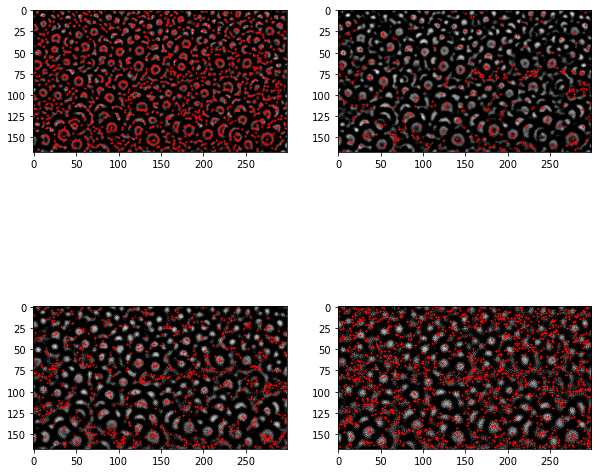

In [391]:
plt.imshof, axarr = plt.subplots(2,2, figsize=(10,10))
axarr[0,0].imshow(result[0])
axarr[0,1].imshow(result[1])
axarr[1,0].imshow(result[2])
axarr[1,1].imshow(result[3])